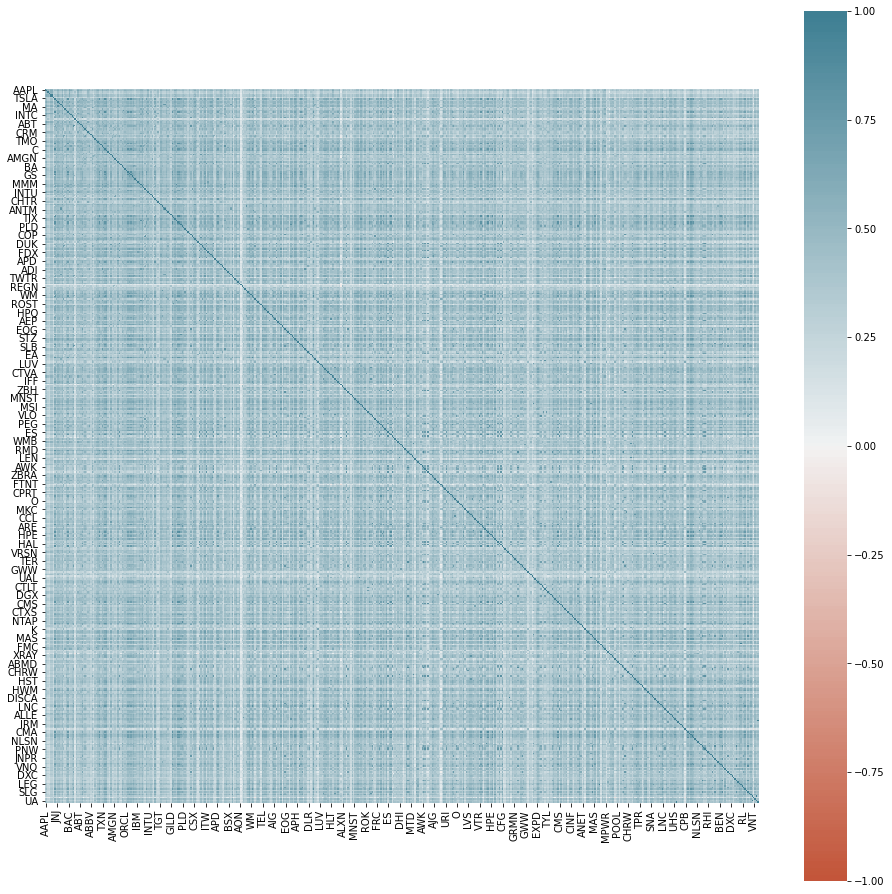

In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.cluster.hierarchy as sch

# df = pd.read_csv('downloaded_data/AAPL.csv',parse_dates=True, usecols=['Date', 'Adj Close'], na_values=['nan'])
# df.rename(columns={'Adj Close': 'AAPL'}, inplace=True)


def symbol_to_path(symbol):
    # todo: path to be changed 
    return "downloaded_data/data/{}.csv".format(str(symbol))

def get_data(symbols, df):
    first = True
    for symbol in symbols:
        if first:
            df = pd.read_csv(symbol_to_path(symbol), parse_dates=True, usecols=['Date', 'Adj Close'], na_values=['nan'])
            df.rename(columns={'Adj Close': symbol}, inplace=True)
            first = False
            
        try:
            df_temp = pd.read_csv(symbol_to_path(symbol),
                                  parse_dates=True, usecols=['Date', 'Adj Close'], na_values=['nan'])

            df_temp = df_temp.rename(columns={'Adj Close': symbol})
    #         df = pd.concat([df, df_temp], axis=1)
            df = pd.merge(left=df, right=df_temp, how='left', left_on='Date', right_on='Date')
        except: 
            print('some error')

    return df

# symbols = ['GS', 'MS', 'JPM', 'GOOG', 'TSLA', 'MSFT', 'FB', 'ZM', 'BABA']
symbols = []

with open('sp500_symbol.csv', 'r') as f:
    txt = f.readlines()
    for s in txt:
        s = s.strip()
        if s != 'AAPL' and os.path.exists(symbol_to_path(s)):
            symbols.append(s)

data = get_data(symbols, df)

data.set_index('Date', inplace=True)
corr = data.pct_change().corr()

plt.figure(figsize = (16,16))
sns_plot = sns.heatmap(corr, vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(20, 220, n=200), square=True)
fig = sns_plot.get_figure()
fig.savefig('corr.png')

In [3]:
def correlDist(corr):
    dist = ((1-corr)/2.)**.5
    return dist

In [4]:
dist = correlDist(corr)
dist.fillna(0)
sum(sum(dist.values[i] > 1) for i in range(len(dist.values)))

0

In [5]:
def getQuasiDiag(link):
    link = link.astype(int)
    sortIx = pd.Series([link[-1,0],link[-1,1]])
    numItems = link[-1,3]
    while sortIx.max()>=numItems:
        sortIx.index = range(0,sortIx.shape[0]*2,2)
        df0 = sortIx[sortIx>=numItems]
        i=df0.index
        j=df0.values-numItems
        sortIx[i] = link[j,0]
        df0 = pd.Series(link[j,1],index=i+1)
        sortIx = sortIx.append(df0)
        sortIx = sortIx.sort_index()
        sortIx.index = range(sortIx.shape[0])
    return sortIx.tolist()

In [43]:
def cluster_plot(corr, figname):
    dist = correlDist(corr)
    dist_n = dist.fillna(0)
    link = sch.linkage(dist_n, 'single')
    sortIx = getQuasiDiag(link)
    sortIx = corr.index[sortIx].tolist()
    df0 = corr.loc[sortIx, sortIx]

    plt.figure(figsize = (20,20))
    sns_plot = sns.heatmap(df0, vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(20, 220, n=200), square=True)
    fig = sns_plot.get_figure()
    fig.savefig(figname)

<ipython-input-13-0f85d61831b9>:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  link = sch.linkage(dist, 'single')


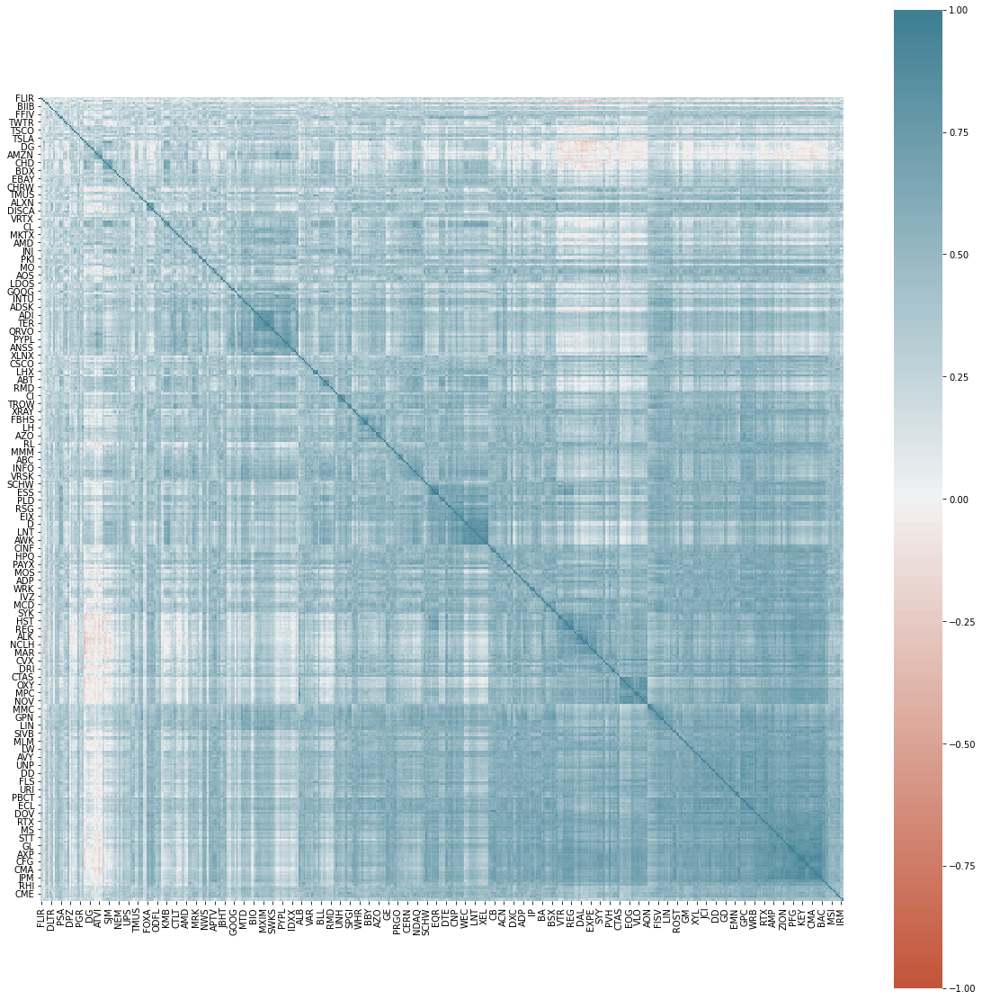

In [14]:
data_1y = data.loc['2020-03-15':'2021-03-15', :]
corr_1y = data_1y.pct_change().corr()
cluster_plot(corr_1y)

In [44]:
def clustering_date(data, start, end, figname):
    data_tmp = data.loc[start:end, :]
    corr_tmp = data_tmp.pct_change().corr()
    try:
        cluster_plot(corr_tmp, figname)
    except:
        print('error')

ploting 2011-03-16 to 2012-03-16


<ipython-input-43-de435f222ce2>:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  link = sch.linkage(dist_n, 'single')


ploting 2012-03-16 to 2013-03-16


<ipython-input-43-de435f222ce2>:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  link = sch.linkage(dist_n, 'single')


ploting 2013-03-16 to 2014-03-16


<ipython-input-43-de435f222ce2>:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  link = sch.linkage(dist_n, 'single')


ploting 2014-03-16 to 2015-03-16


<ipython-input-43-de435f222ce2>:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  link = sch.linkage(dist_n, 'single')


ploting 2015-03-16 to 2016-03-16


<ipython-input-43-de435f222ce2>:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  link = sch.linkage(dist_n, 'single')


ploting 2016-03-16 to 2017-03-16


<ipython-input-43-de435f222ce2>:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  link = sch.linkage(dist_n, 'single')


ploting 2017-03-16 to 2018-03-16


<ipython-input-43-de435f222ce2>:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  link = sch.linkage(dist_n, 'single')


ploting 2018-03-16 to 2019-03-16


<ipython-input-43-de435f222ce2>:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  link = sch.linkage(dist_n, 'single')


ploting 2019-03-16 to 2020-03-16


<ipython-input-43-de435f222ce2>:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  link = sch.linkage(dist_n, 'single')


ploting 2020-03-16 to 2021-03-16


<ipython-input-43-de435f222ce2>:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  link = sch.linkage(dist_n, 'single')


done!


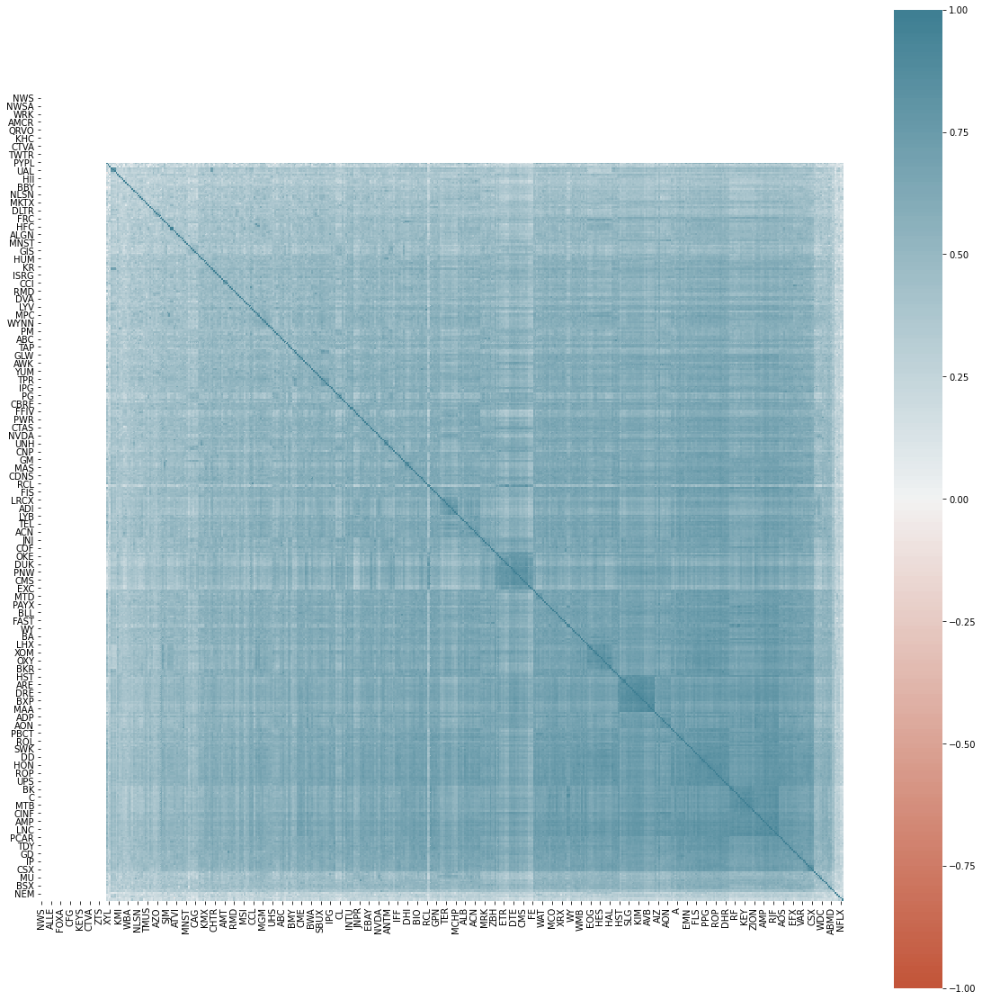

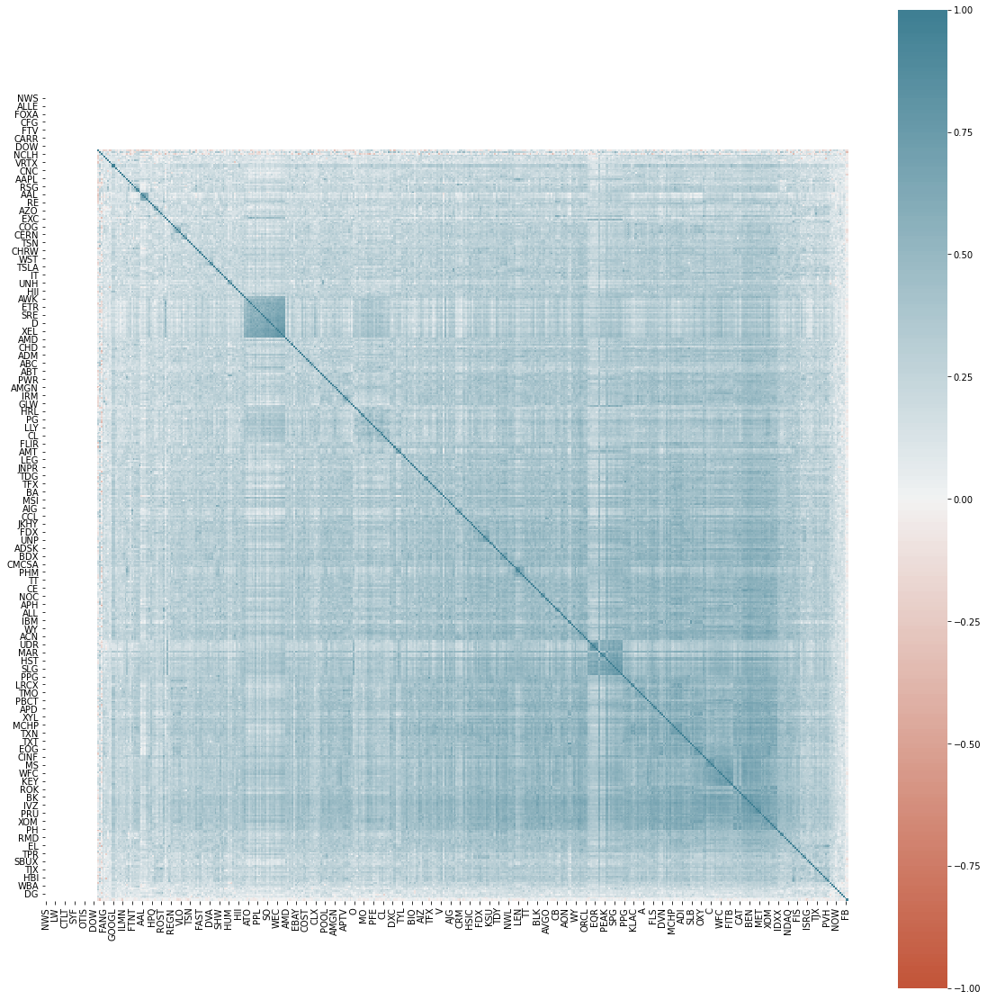

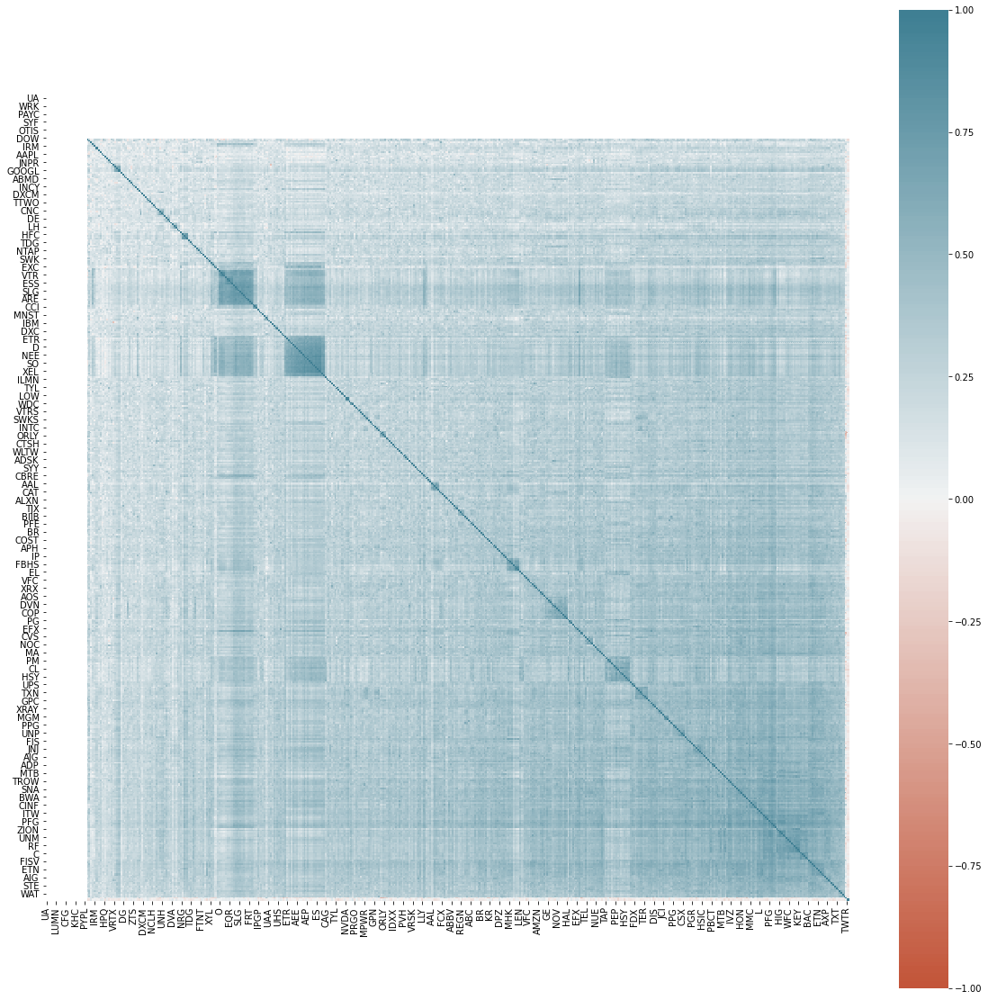

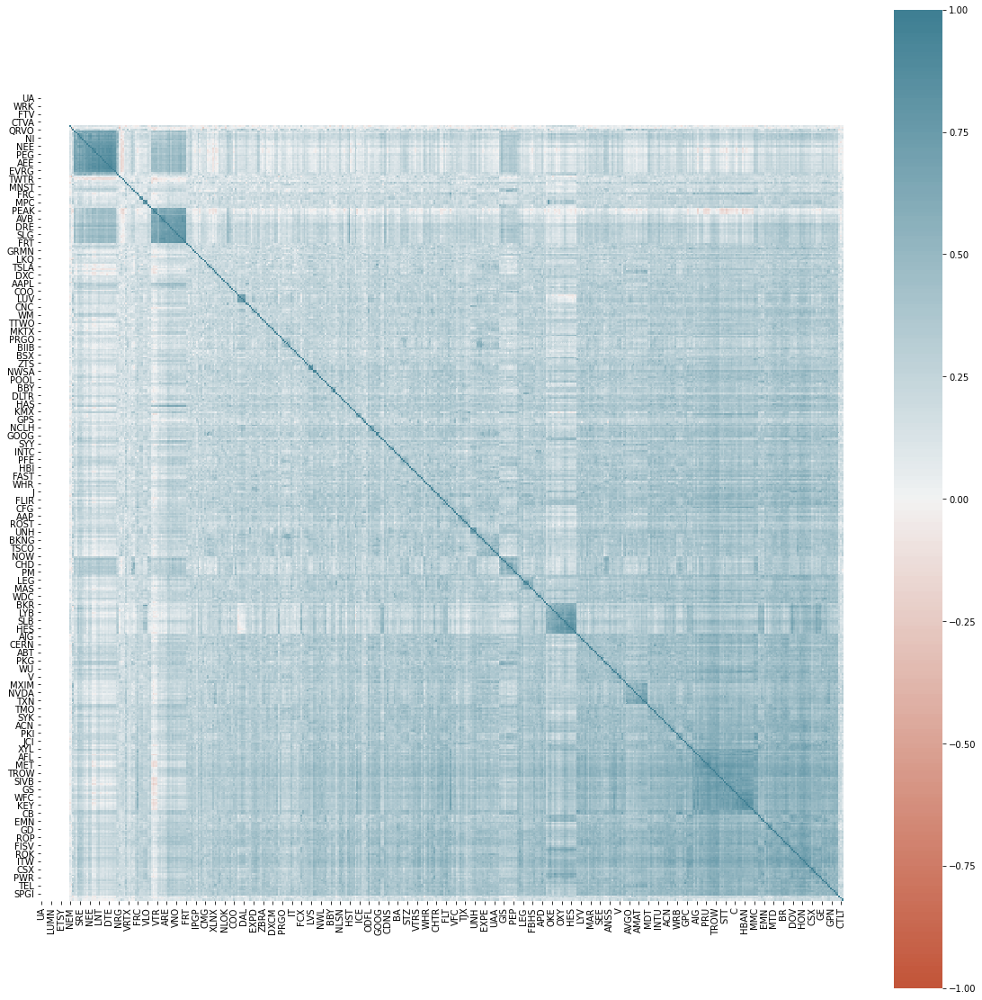

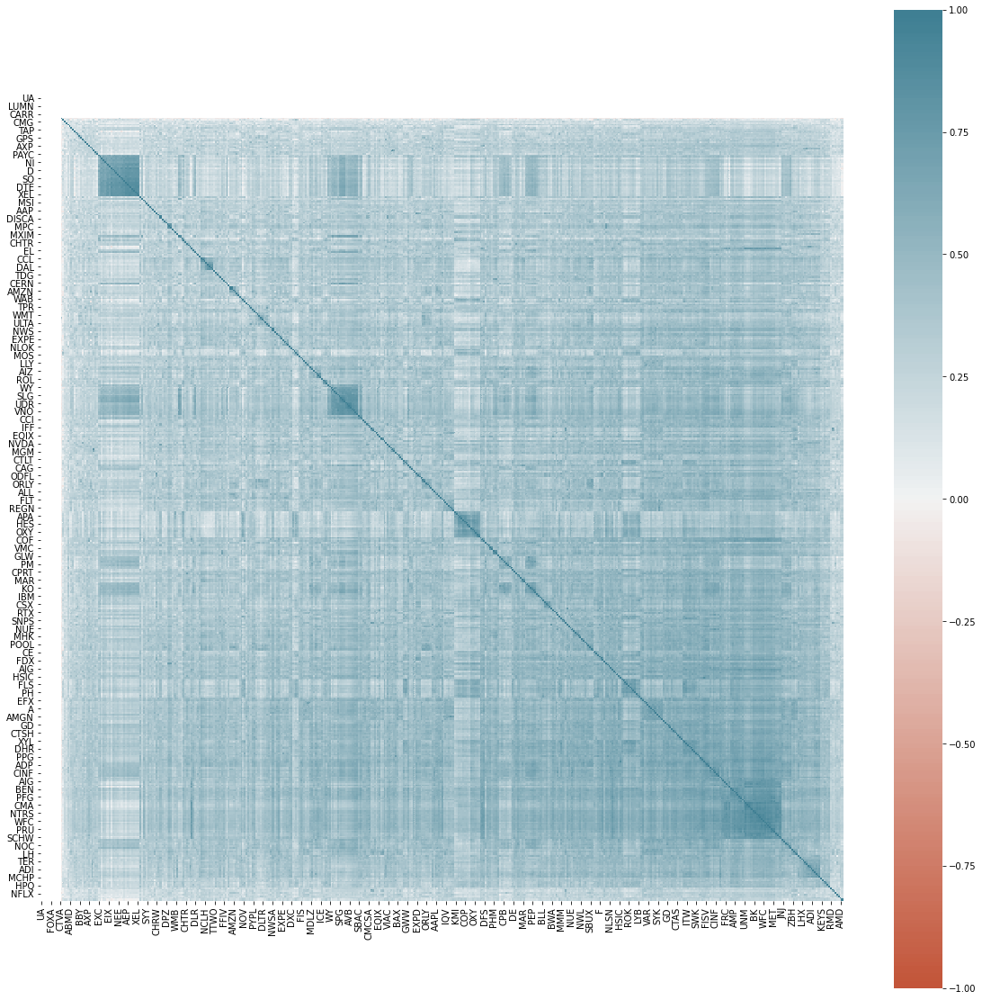

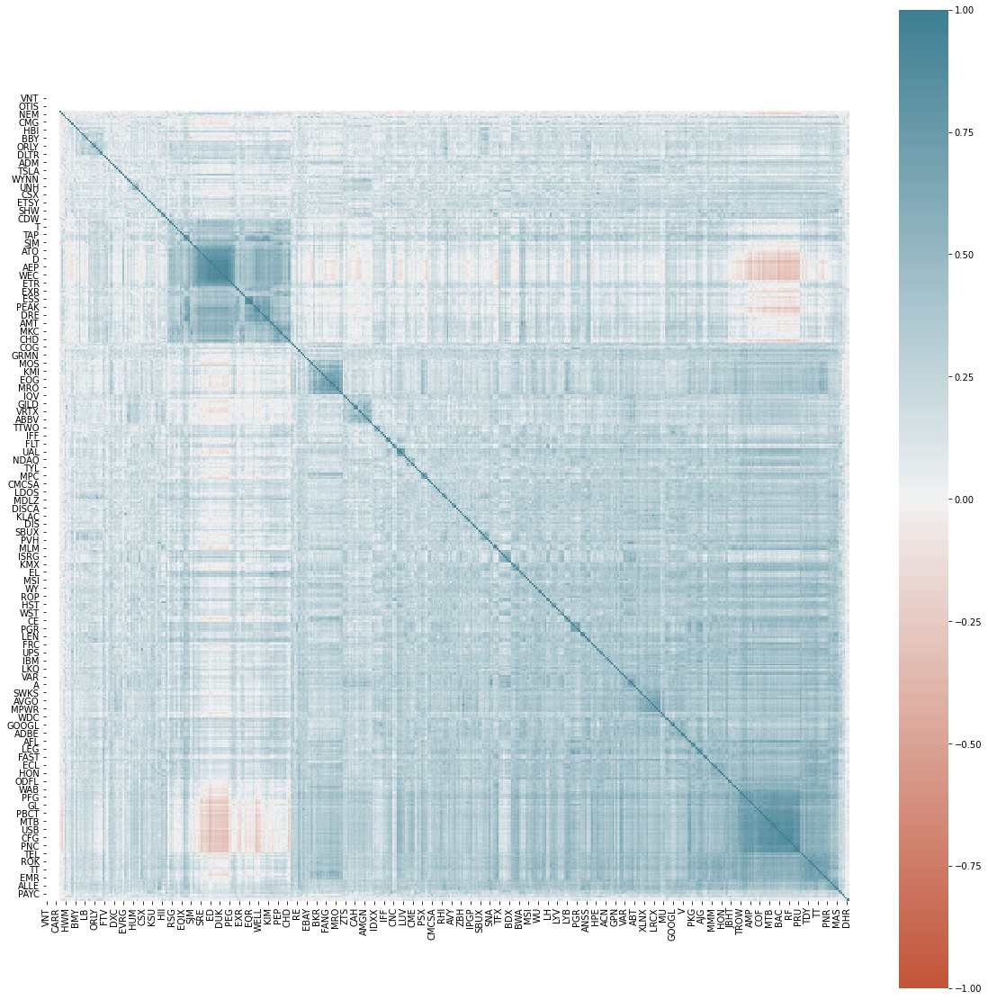

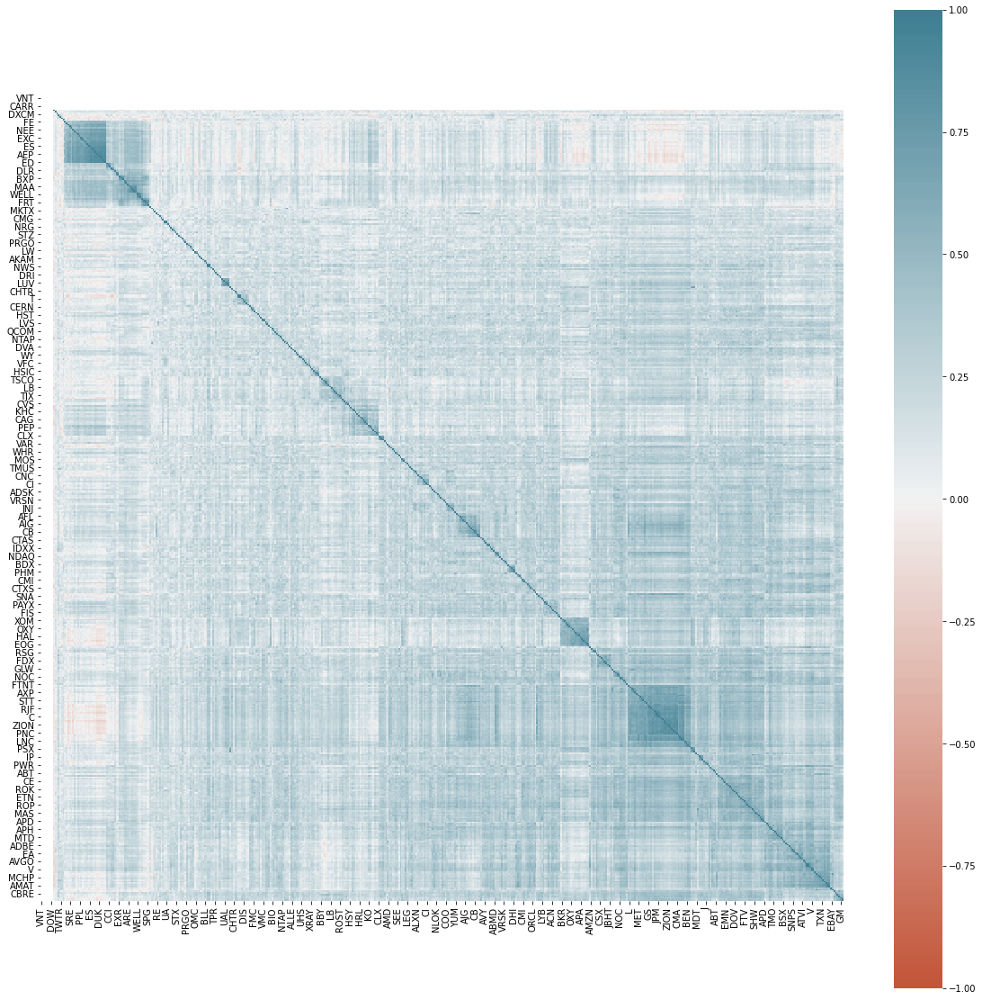

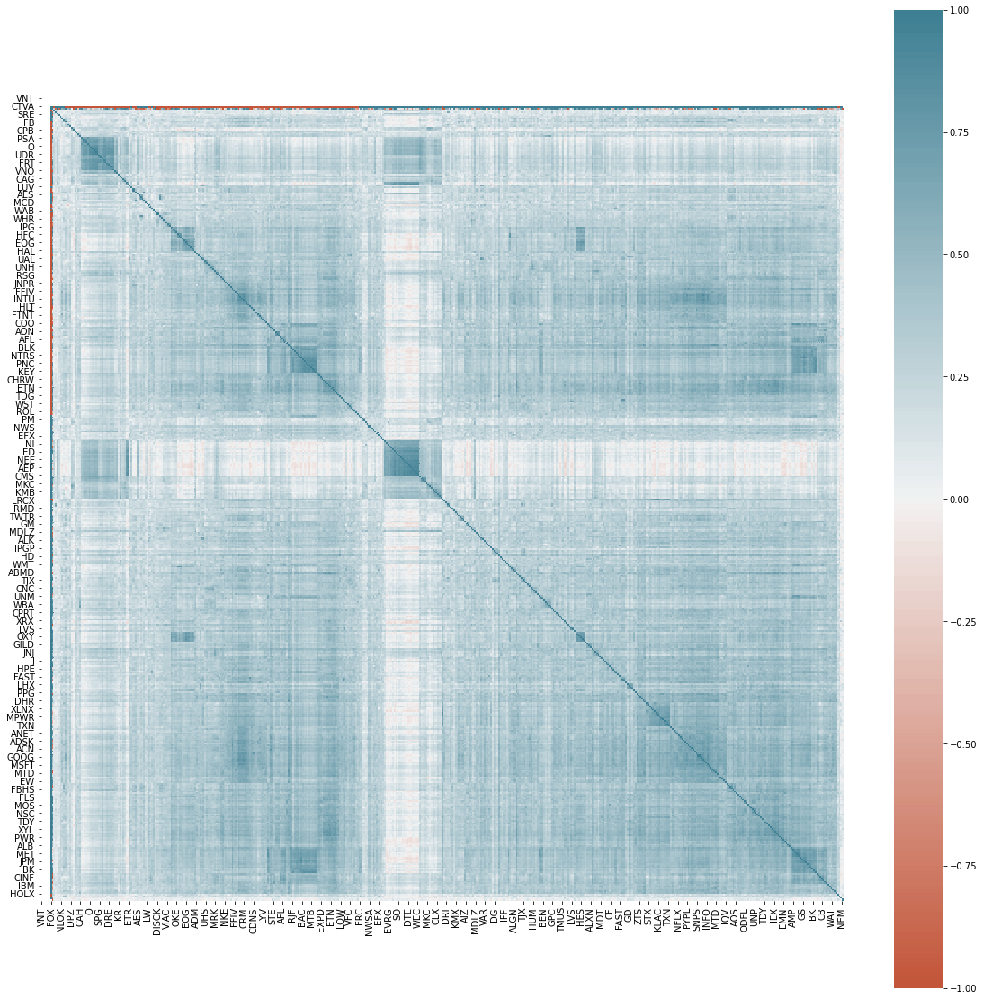

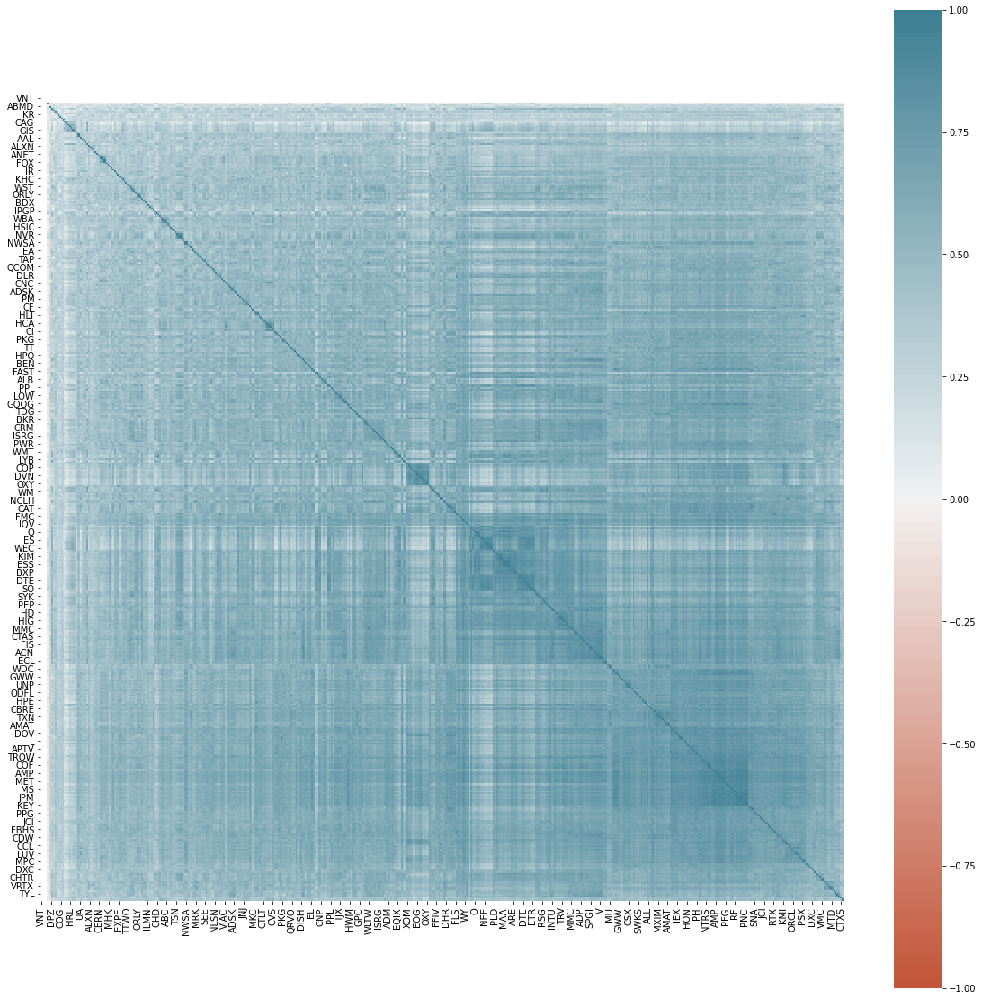

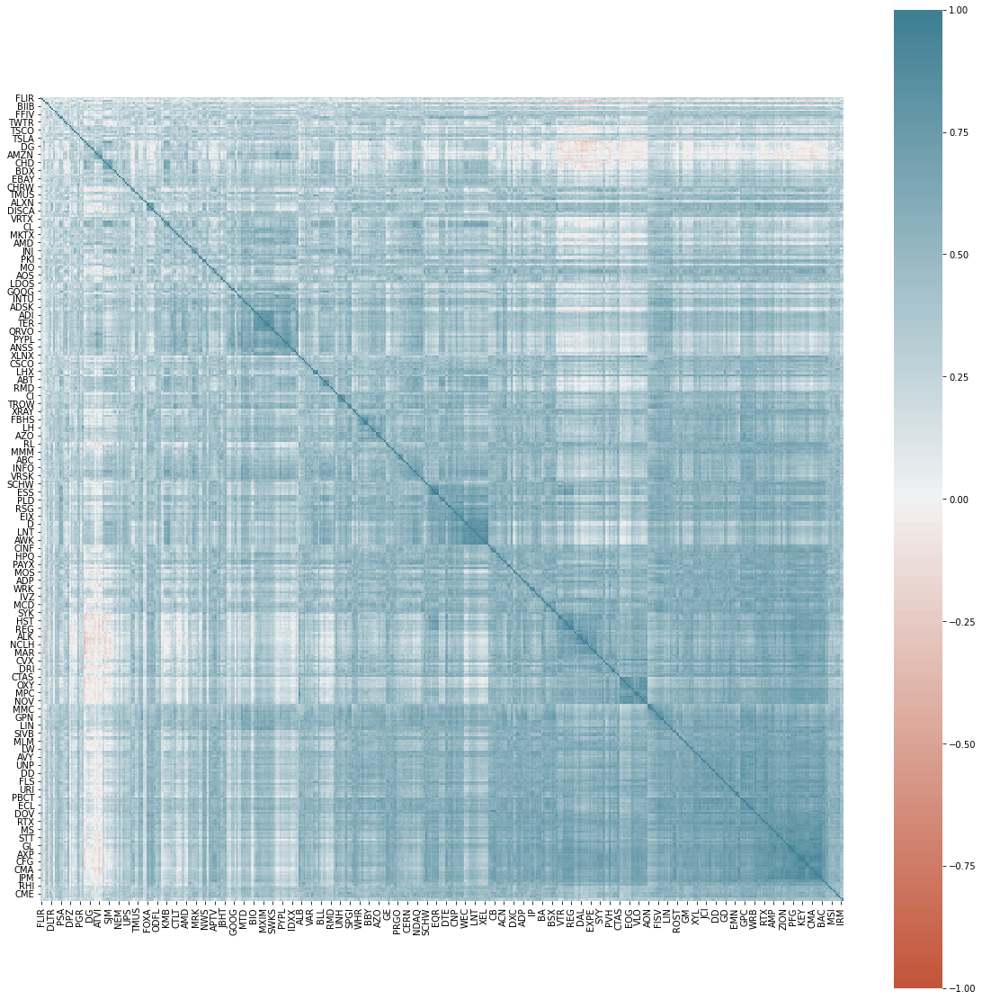

In [49]:
start_dates = ['2011-03-16', '2012-03-16', '2013-03-16', '2014-03-16', '2015-03-16', '2016-03-16','2017-03-16', \
               '2018-03-16','2019-03-16','2020-03-16']

end_dates = ['2012-03-16', '2013-03-16', '2014-03-16', '2015-03-16', '2016-03-16','2017-03-16', \
               '2018-03-16','2019-03-16','2020-03-16', '2021-03-16']
# end_dates = ['2012-01-01', '2013-01-01', '2014-01-01', '2015-01-01', '2016-01-01','2017-01-01', \
#                '2018-01-01','2019-01-01','2020-01-01', '2021-01-01', '2021-03-16']

# end_dates = ['2017-03-16','2018-03-16','2019-03-16','2020-03-16','2021-03-16']

for (i,(s,e)) in enumerate(zip(start_dates, end_dates)):
    print('ploting {} to {}'.format(s, e))
    clustering_date(data, start_dates[i], end_dates[i], 'corr_c_{}.png'.format(i))
print('done!')

<ipython-input-32-3f0f1ef08ff3>:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  link = sch.linkage(dist_n, 'single')


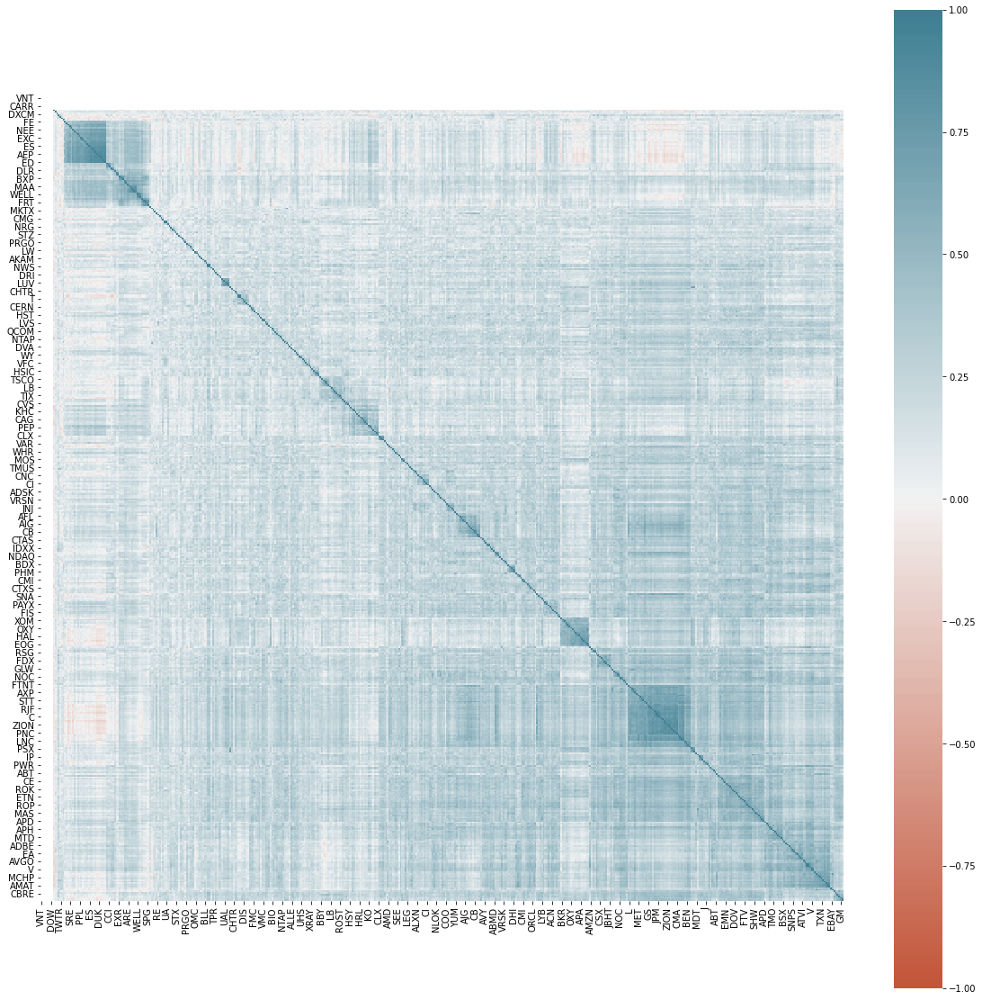

In [39]:
clustering_date(data, start_dates[1], end_dates[1])

<ipython-input-32-3f0f1ef08ff3>:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  link = sch.linkage(dist_n, 'single')


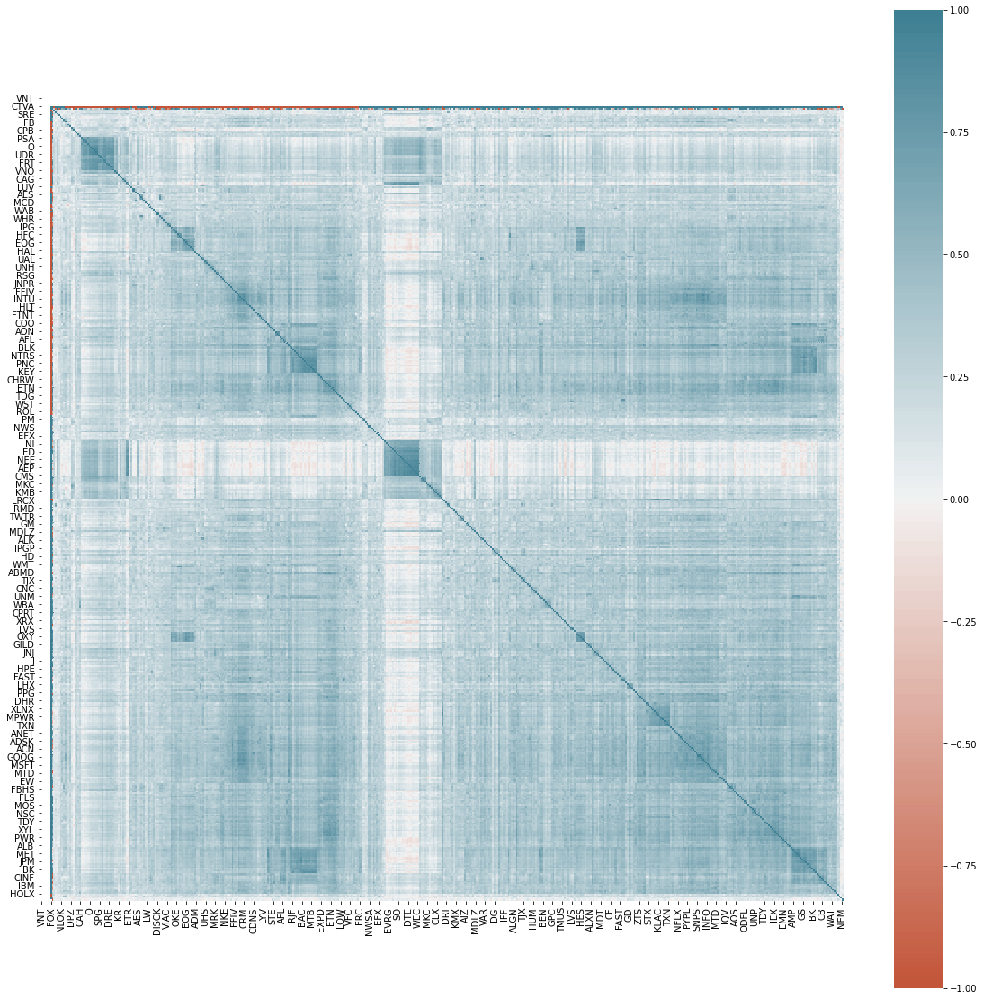

In [40]:
clustering_date(data, start_dates[2], end_dates[2])

<ipython-input-32-3f0f1ef08ff3>:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  link = sch.linkage(dist_n, 'single')


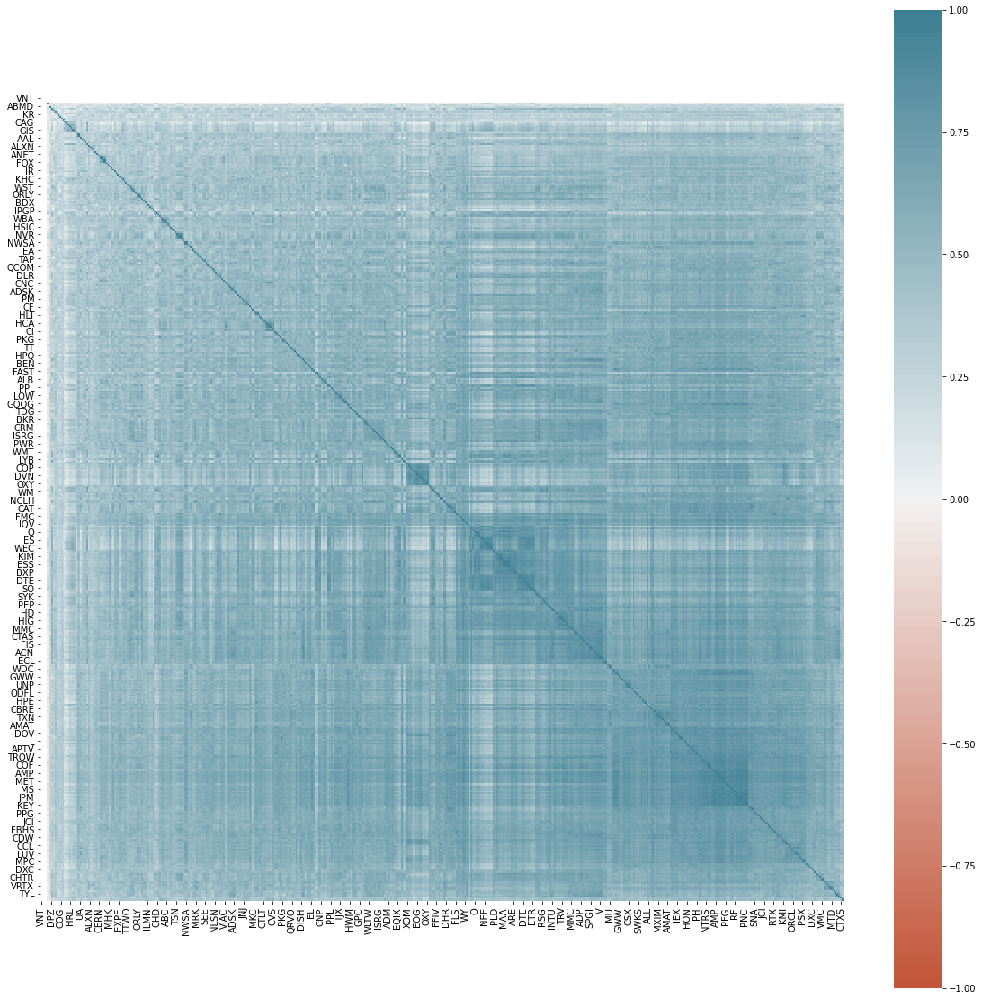

In [41]:
clustering_date(data, start_dates[3], end_dates[3])

<ipython-input-32-3f0f1ef08ff3>:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  link = sch.linkage(dist_n, 'single')


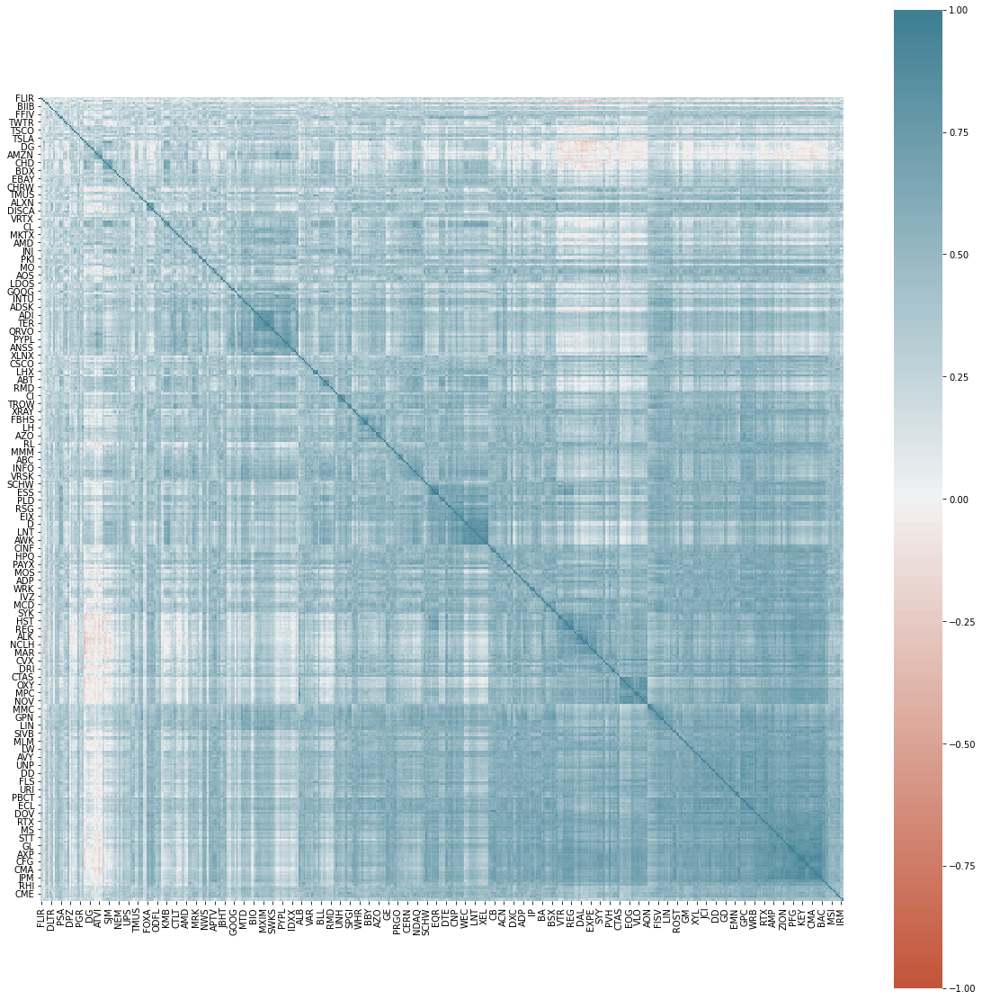

In [42]:
clustering_date(data, start_dates[4], end_dates[4])